# Set-up environment 

In [1]:
import os, datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Preparing the Data Frame

In [2]:
# read the CSV file for the delayed flights, 

df = pd.read_csv('DelayedFlights.csv',sep=",",
                encoding = 'utf-8',
                index_col = 0,
                low_memory = False,
                nrows=500000 
                  )

In [3]:
# dealing with the null values

df['DepDelay'].fillna(df['DepDelay'].interpolate(), inplace=True)
df['ArrDelay'].fillna(df['ArrDelay'].interpolate(), inplace=True)
df['AirTime'].fillna(df['AirTime'].interpolate(), inplace=True)

In [4]:
#Getting the columns we will work on it on this exercise
data = df[['UniqueCarrier','DepDelay','ArrDelay','AirTime']]

In [5]:
#Dealing and removing the outliers using the IQR Score

#calculating IQR Score

Q1 = data.quantile(0.25)
Q3 = data.quantile(0.75)
IQR = Q3 - Q1

#Removing the outliers 

data = data[~((data<(Q1-1.5 * IQR))|
           (data>(Q3 + 1.5 * IQR))).any(axis=1)]

In [6]:
#Saving the data frame 

data.to_csv('Viz.csv')

# Data Visualization

## Overview Visualization

### Using AutoViz Library

Alert! from version 0.1.36. After importing, you must do '%matplotlib inline' to display charts in Jupyter Notebooks.
    AV = AutoViz_Class()
    AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 does not display plots but saves them in AutoViz_Plots folder in local machine.
Updated: chart_format='bokeh' generates and displays charts in your local Jupyter notebook.
      chart_format='server' generates and displays charts in the browser - one tab for each chart.
      chart_format='html' silently saves charts HTML format - they are also interactive!


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
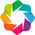

In [7]:
# Getting the Autoviz Library 
#https://github.com/AutoViML/AutoViz
from autoviz.AutoViz_Class import AutoViz_Class
Av = AutoViz_Class()

    max_rows_analyzed is smaller than dataset shape 436078...
        randomly sampled 150000 rows from read CSV file
Shape of your Data Set loaded: (150000, 5)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    5 Predictors classified...
        1 variables removed since they were ID or low-information variables
Since Number of Rows in data 150000 exceeds maximum, randomly sampling 150000 rows for EDA...
Number of All Scatter Plots = 6


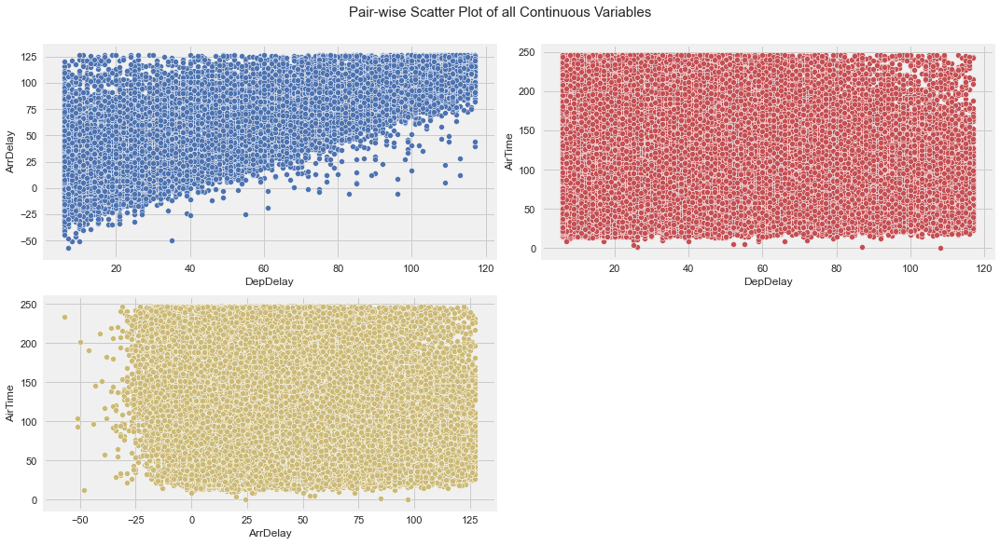

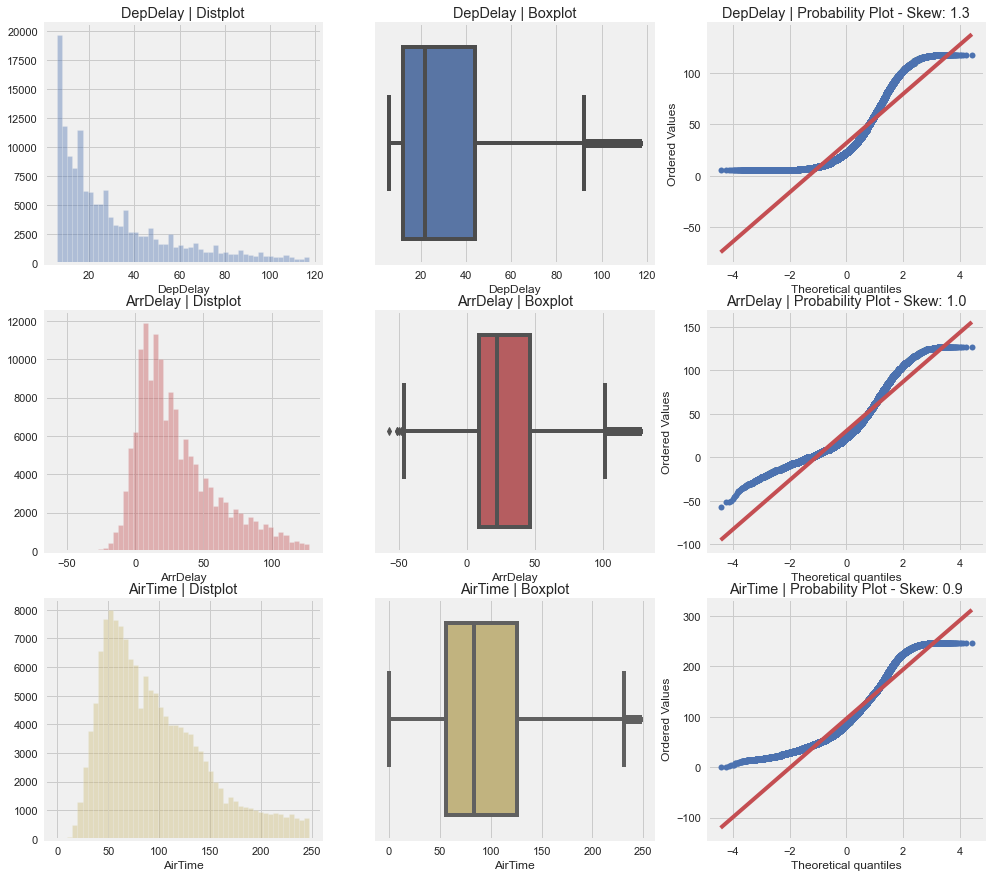

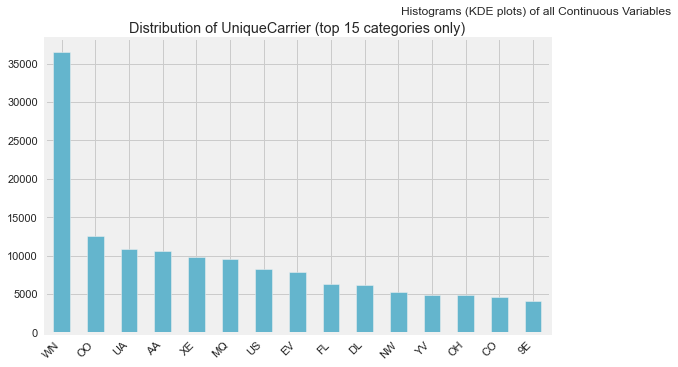

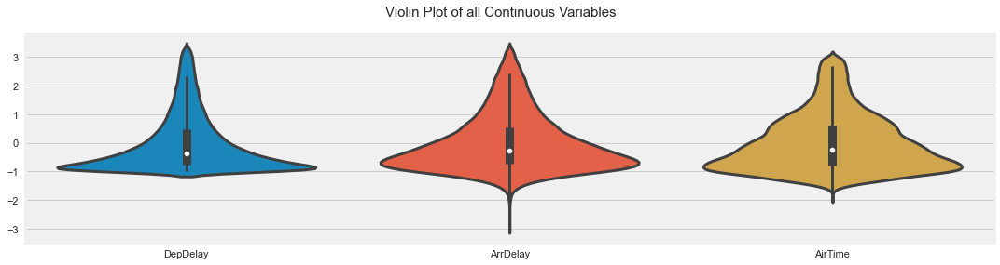

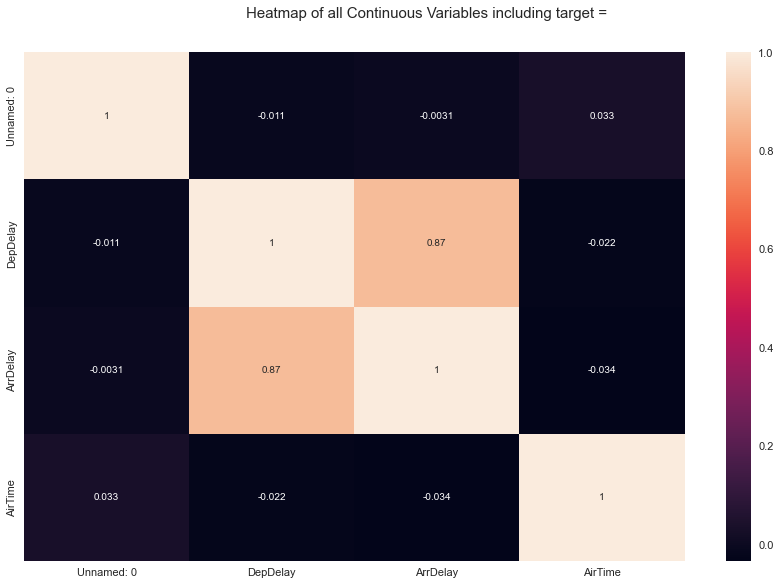

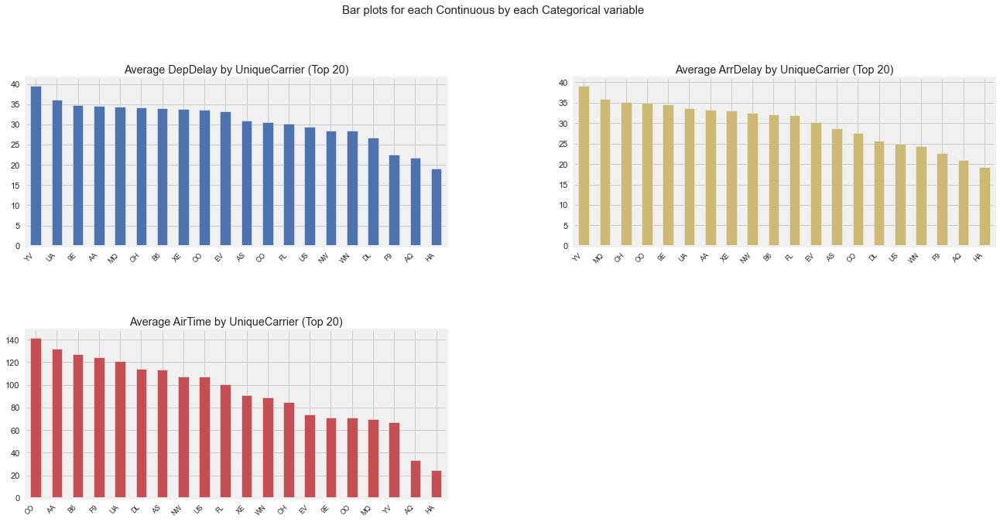

Time to run AutoViz = 5 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [10]:
%matplotlib inline
df_viz = Av.AutoViz('Viz.csv')

### Using SeaBorn

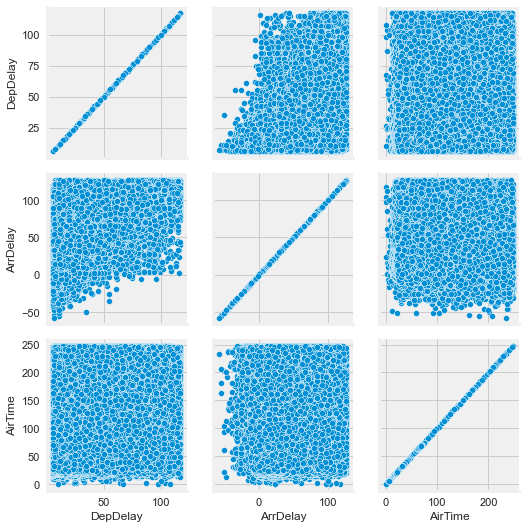

In [22]:
# Using PairGrid 

g = sns.PairGrid(data)
g.map(sns.scatterplot)

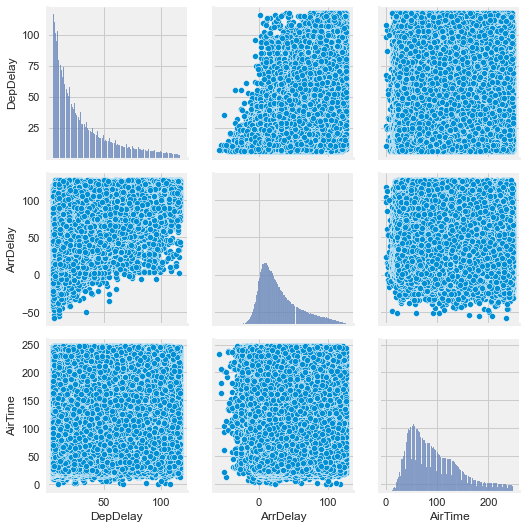

In [23]:
# histplot and scatter for Diag and not

g = sns.PairGrid(data)
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)


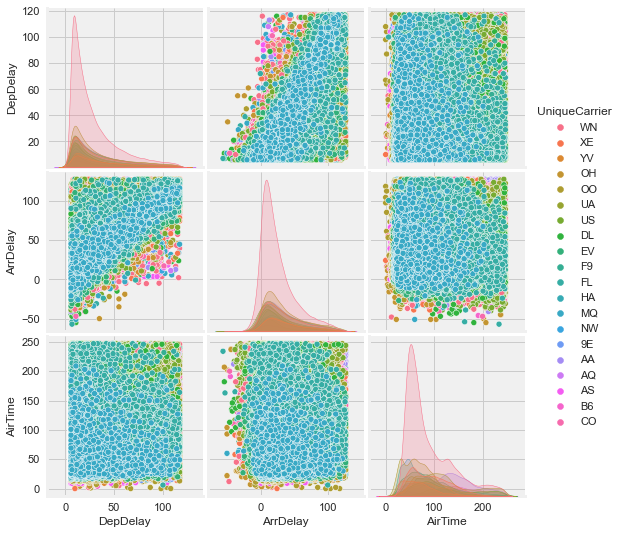

In [24]:
# plotting by Unique Carrier 

sns.pairplot(data, hue='UniqueCarrier')

<AxesSubplot:xlabel='AirTime', ylabel='Density'>

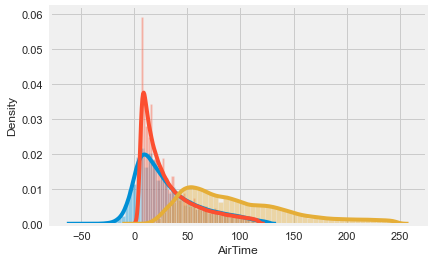

In [25]:
#cheqye distrubutions vor other variabls

sns.distplot(data['ArrDelay'])

sns.distplot(data['DepDelay'])

sns.distplot(data['AirTime'])


## A categorical variable (UniqueCarrier)

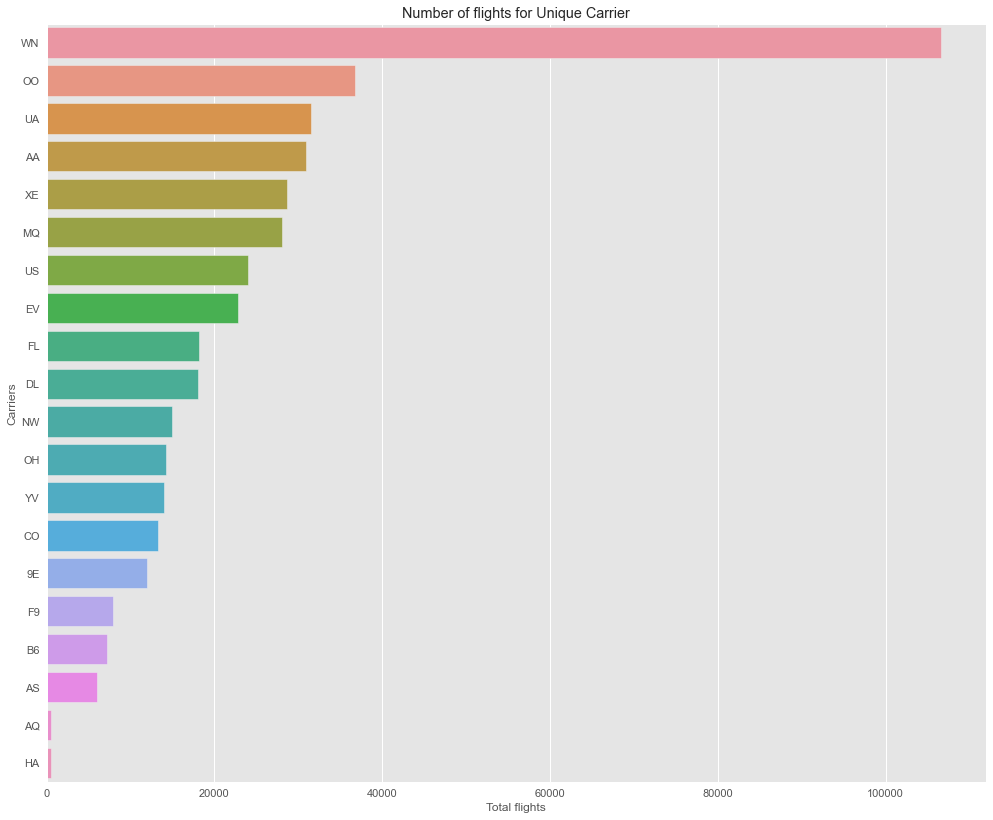

In [49]:
# Plotting a unique categarical variable by counting:

plt.figure(figsize=(15,13))
plt.title('Number of flights for Unique Carrier')

plt.style.use('ggplot')
axis = sns.countplot(y="UniqueCarrier", data=data, order=data['UniqueCarrier'].value_counts().index)

#plt.figtext(1, 0, fig, fontsize=10, ha='center')
plt.ylabel('Carriers')
plt.xlabel('Total flights')

plt.yticks(rotation=0)
plt.savefig('Number_flights_Unique_Carrier.png')
plt.show()

## A numeric variable (ArrDelay)

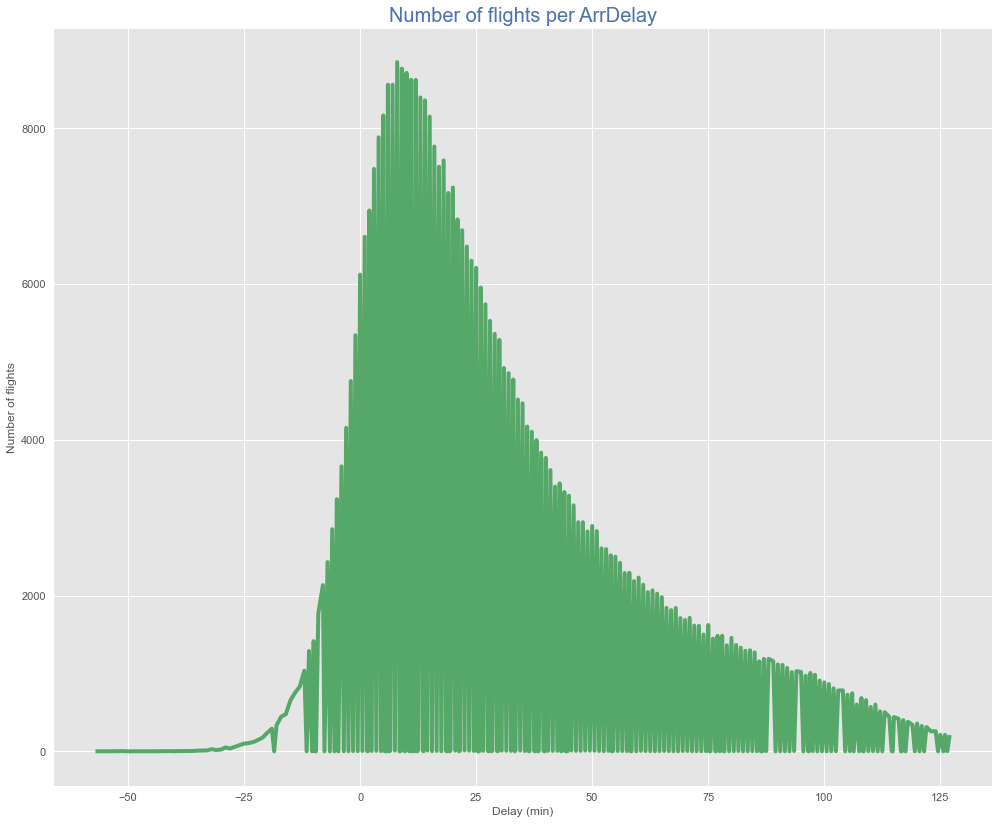

In [40]:
 # Plotting a unique numeric variable by counting:

data1 = data['ArrDelay'].value_counts()

plt.figure(figsize=(15,13))
sns.lineplot(x=data1.index, y=data1.values, color = 'g')

plt.title('Number of flights per ArrDelay', fontsize=20, color='b', alpha=1)

plt.xlabel('Delay (min)')
plt.ylabel('Number of flights')



plt.show()

## A numeric and a categorical variable (ArrDelay and UniqueCarrier)

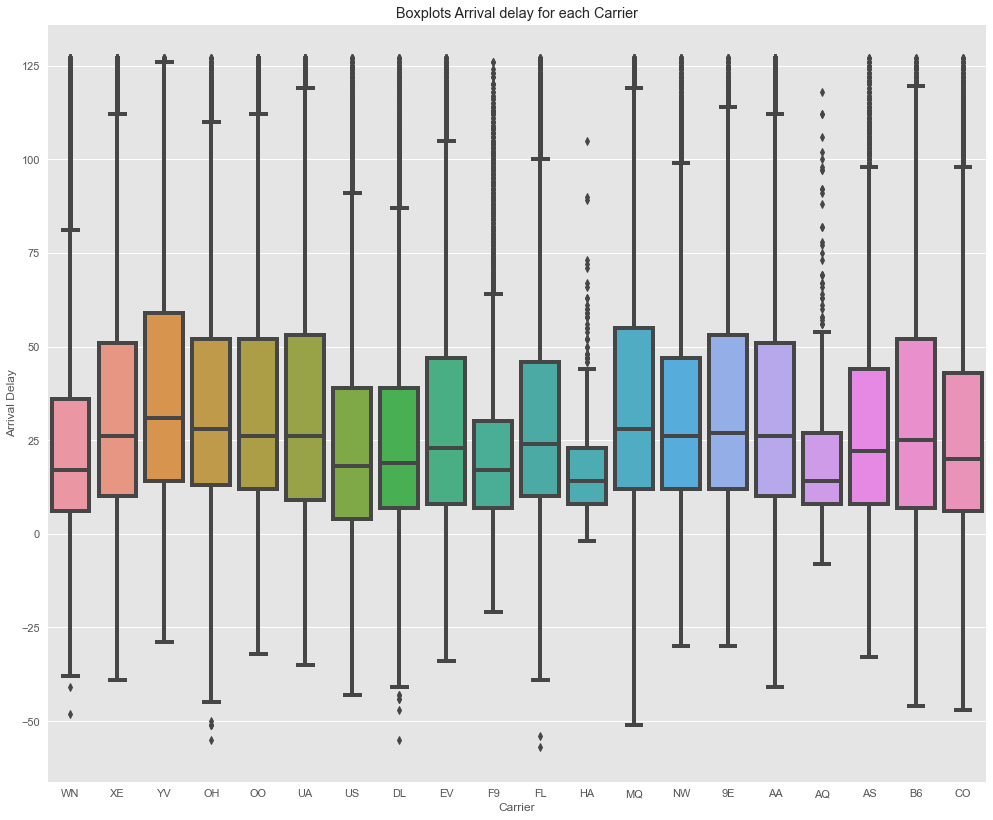

In [48]:
#using boxplot to compare between carriers and arrival delay

data2 = data[['UniqueCarrier','ArrDelay']]

plt.figure(figsize=(15,13))
sns.boxplot(x=data2['UniqueCarrier'],y=data2['ArrDelay'])

plt.title('Boxplots Arrival delay for each Carrier')
plt.xlabel('Carrier')
plt.ylabel('Arrival Delay')


plt.show()

## Two numeric variables (ArrDelay and DepDelay)

<Figure size 1080x936 with 0 Axes>

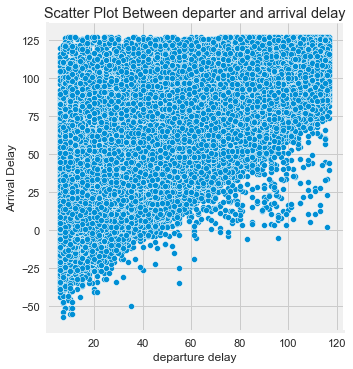

In [28]:
# Dues variables numèriques (ArrDelay i DepDelay)

data3 = data[['ArrDelay','DepDelay']]

plt.figure(figsize=(15,13))

axes = sns.relplot(data=data3, x= 'DepDelay', y = 'ArrDelay',kind="scatter")
plt.title('Scatter Plot Between departer and arrival delay')
plt.xlabel('departure delay')
plt.ylabel('Arrival Delay')


plt.savefig('RelationArrivaldelayDepartureDelay.png')
plt.show()


### Tres variables (ArrDelay, DepDelay i UniqueCarrier)

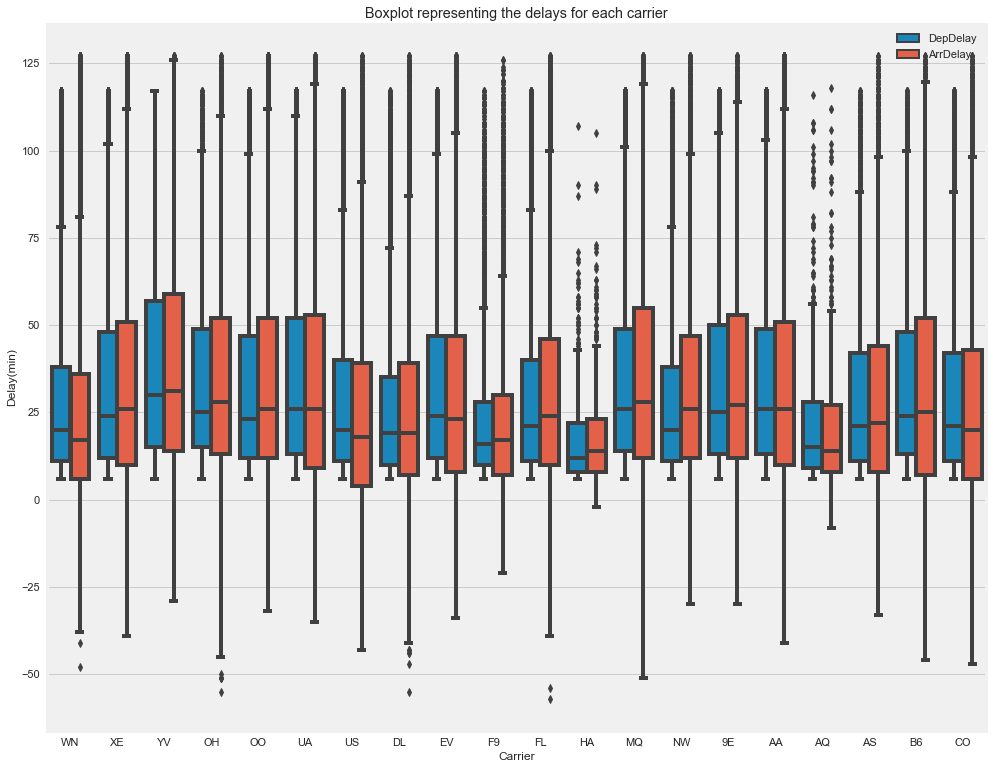

In [31]:
#Making a new data frame with the variables and making them having the same columns name 

dep_data_df = data[['UniqueCarrier','DepDelay']]
dep_data_df.rename(columns={'DepDelay': 'Delay'}, inplace = True)
dep_data_df['type'] = 'DepDelay'

arr_data_df = data[['UniqueCarrier','ArrDelay']]
arr_data_df.rename(columns={'ArrDelay': 'Delay'}, inplace = True)
arr_data_df['type']= 'ArrDelay'

# concat the data frames

data4 = pd.concat([dep_data_df,arr_data_df])
del dep_data_df, arr_data_df

#ploting using Boxplot 
plt.figure(figsize=(15,13))


sns.boxplot(x=data4['UniqueCarrier'], y=data4['Delay'], hue=data4["type"])
plt.title('Boxplot representing the delays for each carrier')

plt.xlabel('Carrier')
plt.ylabel('Delay(min)')

plt.legend(loc='upper right')


plt.show()


### More than three variables (ArrDelay, DepDelay, AirTime and UniqueCarrier).


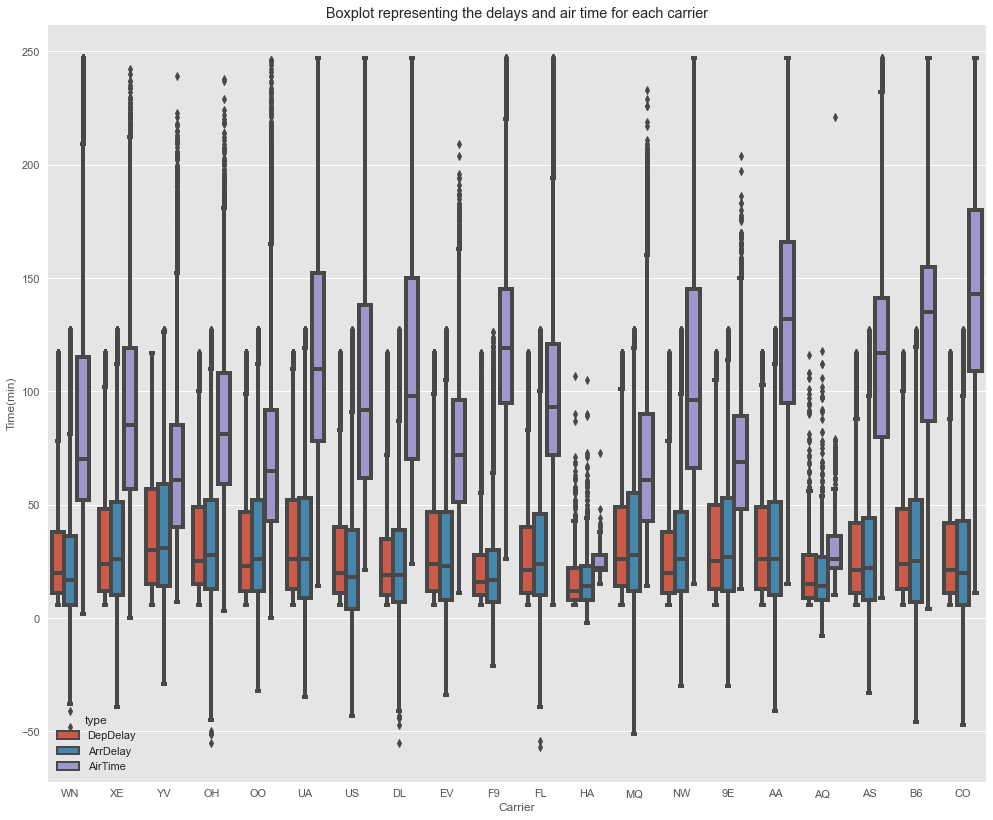

In [47]:
#Creating a new data frame for each variable to be able to concat later 

dep_data_df = data[['UniqueCarrier','DepDelay']]
dep_data_df.rename(columns={'DepDelay': 'Time'}, inplace = True)
dep_data_df['type'] = 'DepDelay'

arr_data_df = data[['UniqueCarrier','ArrDelay']]
arr_data_df.rename(columns={'ArrDelay': 'Time'}, inplace = True)
arr_data_df['type']= 'ArrDelay'

air_time_df = data[['UniqueCarrier','AirTime']]
air_time_df.rename(columns={'AirTime': 'Time'}, inplace=True)
air_time_df['type'] = 'AirTime'

# Concat the 3 data frames 

data5 = pd.concat([dep_data_df, arr_data_df ,air_time_df])

#plotting the different variables 

plt.figure(figsize=(15,13))

sns.boxplot(x=data5['UniqueCarrier'], y=data5['Time'], hue=data5['type'], )

plt.title('Boxplot representing the delays and air time for each carrier')

plt.xlabel('Carrier')
plt.ylabel('Time(min)')

plt.show()



## Save to html

I been using the plot.savefig() function for save the graphics and a I will use a extra withg autoviz yo save as HTML

In [30]:
# Gettin all the graphics from Autoviz

%matplotlib inline
df_viz = Av.AutoViz('Viz.csv', chart_format='html')

    max_rows_analyzed is smaller than dataset shape 436078...
        randomly sampled 150000 rows from read CSV file
Shape of your Data Set loaded: (150000, 5)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    5 Predictors classified...
        1 variables removed since they were ID or low-information variables
Since Number of Rows in data 150000 exceeds maximum, randomly sampling 150000 rows for EDA...
No scatter plots with depVar when no depVar is given.
Saving pair_scatters in HTML format
Saving distplots_nums in HTML format         
Saving violinplots in HTML format    
Saving heatmaps in HTML format
Saving cat_var_plots in HTML format
Time to run AutoViz (in seconds) = 11        


I Will add this notebok on the same Repo with Task 5 from Sprint 2